# HR Analytics

In [214]:
# Importing all the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
# Reading the dataset
df = pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [3]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [4]:
# This is the dataset, 
# we have 1470 rows(0-1469).
# We have 35 columns(0-34).
# We can also infer from here that the target column is "Attrition" and its contains categorical data (has 2 classes), hence is a 
# Classification Problem
# We need to use Classification models to perform our predictions.

# Exploratory Data Analysis (EDA)

In [5]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [6]:
# df.head() displays the first 5 row values(indexed from 0-4) from the dataset

In [7]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [8]:
# df.tail() displays the last 5 row values(indexed from 1465-1469) from the dataset

In [9]:
df.shape

(1470, 35)

In [10]:
# No. of rows - 1470
# No. of columns - 35

In [11]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [12]:
# df.columns gives the names of all 35 column headings

In [13]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [14]:
# This df.dtypes displays the datatypes of all the 35 columns in the dataset
# The info that can be infered here is as below
# The column "Attrition", "Buisness Travel", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "Over18",
# "OverTime" are all of string datatype and hence not identified and dtype for these is shown as object
# All the rest columns have integer values in them and is identified to be of integer datatype.

In [15]:
# Lets take a look into all the columns with String values to understand them more clearly as not all the columns are seen when df is runned

df1 = df[["Attrition", "BusinessTravel", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "Over18",
"OverTime"]]



In [16]:
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [17]:
# So here we can clearly see the values of the columns with string datatype. 
# All the String columns are stored in df1 here

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [19]:
# The info that we can infer from df.info() is as below
# Total entries are 1470(0-1469)
# Total data columns is 35
# Each data column contains no null values, hence the non-null count is 1470 for all the 35 columns
# All the independent variables have integer values, hence datatype is int except for the columns "BusinessTravel", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "Over18",
# "OverTime"
# The columns "BusinessTravel", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "Over18",
# "OverTime" are of string datatype and is seen as float.
# The dependent variable or the target column has String values and hence the datatype is not identified and is seen as object.
# This also gives info on the memory usage



In [20]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [21]:
# This shows that there are no null values in our dataset

In [22]:
np.where(pd.isnull(df)) #This is to find the location if incase null values are present in the dataset

(array([], dtype=int64), array([], dtype=int64))

In [23]:
# This proves that there are no missing entry or a NaN entry in our dataset as already verified in df.isnull().sum()

In [24]:
# Trying to find the duplicate rows in our dataset
duplicate=df.duplicated()
print(duplicate.sum())      # gives no. of duplicate rows in the dataset
df[duplicate]               # prints the duplicate rows in the dataset

0


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [25]:
# There are no duplicate rows present in the dataset

In [26]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [27]:
# From df.describe() we can see the details about various statistical data like Count,Mean,Standard Deviation,Max Value,Min Value for our dataset
# So from min and max values, we basically get the range
# We have the count of 1470 in our dataset
# We have few columns with zero as there minimum value

In [28]:
df["Attrition"].unique()  

array(['Yes', 'No'], dtype=object)

In [29]:
# This is showing the various classes present in the target column, so there are 2 different classes with value(Yes or No)

In [30]:
df["Attrition"].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [31]:
# So we have 1233 no. of NO as values in the target column "Attrition" and 237 no.of YES as values in the target column

# Uni-Variant Analysis for target column

<AxesSubplot:xlabel='Attrition', ylabel='count'>

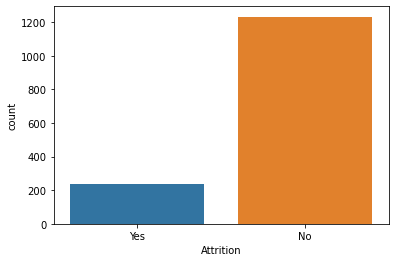

In [32]:
sns.countplot(df['Attrition'])

In [33]:
# We can see visually the value counts present in our target column
# We see that the classes are imbalanced

# Data Manipulation

In [34]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [35]:
# There are three columns with only one unique values. So they are not of any use for our predictions. 
# Employee number is also not much important in prediction as it is an identifier column.

In [36]:
# So we can drop the above 4 columns including Employee Number

In [37]:
df = df.drop(["EmployeeCount","EmployeeNumber","Over18","StandardHours"],axis=1)

In [38]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


In [39]:
# Now that we have dropped irrelevant or not so important columns for our predictions and we see that now we have 31 columns in total

# Uni- Variant Analysis

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

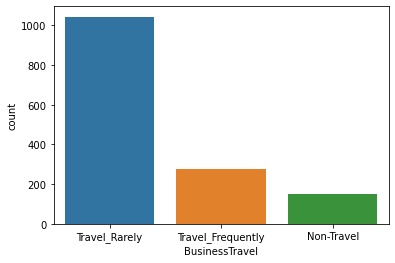

In [40]:
sns.countplot(df['BusinessTravel'])
df['BusinessTravel'].value_counts()

In [41]:

# Majority of the employees travel rarely while 150 of employees are non travellers.

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

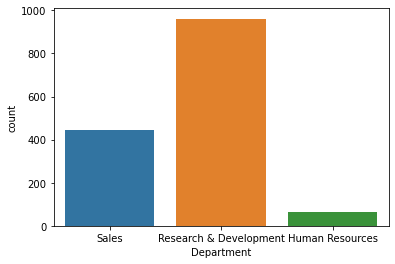

In [42]:
sns.countplot(df['Department'])
df['Department'].value_counts()

In [43]:

# There are three departments in the company.
# Most of the employees work in Research & Development department while very few work in the HR department.

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64

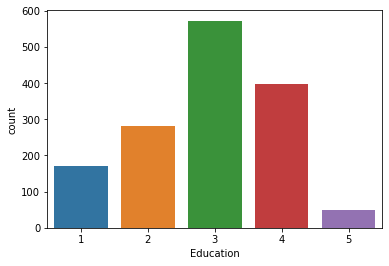

In [44]:
sns.countplot(df['Education'])
df['Education'].value_counts()

In [45]:
# The info that we can infer from here is the there are 5 categories of Education. 
# Only 48 employee hold the highest education qualification. 
# Most of the employees have the education category 3.

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

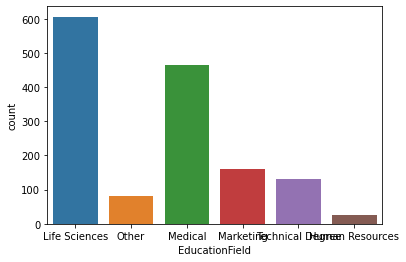

In [46]:
sns.countplot(df['EducationField'])
df['EducationField'].value_counts()

In [47]:
 
# Majority of the employees have Life sciences as there field. 
# There are a lot of employees belonging to medical field as well. Apart from all fields, there is an Other field which may contain employees from rare educational fields.
# Least employees have Human Resources as their Education field


3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64

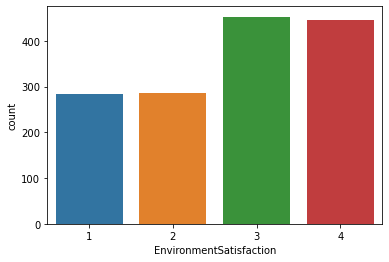

In [48]:
sns.countplot(df['EnvironmentSatisfaction'])
df['EnvironmentSatisfaction'].value_counts()

In [49]:
# Here we can infer that most of the employees(453 + 446) show high levels of environment satisfaction 
# but around 284 employees show very low satisfaction which is quite a big number.
# Around 287 employees have also depicted low satisfaction.

Male      882
Female    588
Name: Gender, dtype: int64

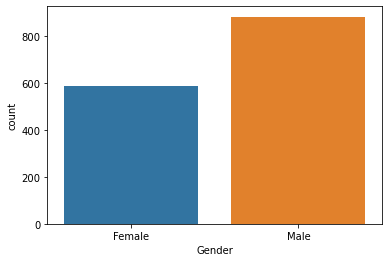

In [50]:
sns.countplot(df['Gender'])
df['Gender'].value_counts()

In [51]:
# Majority of the employees working are males. 
# Females are 588 in number whereas males are 882

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64

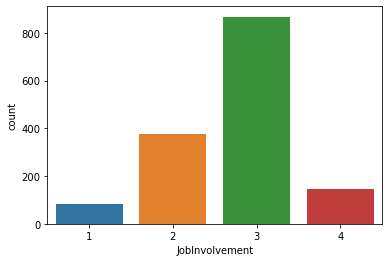

In [52]:
sns.countplot(df['JobInvolvement'])
df['JobInvolvement'].value_counts()

In [53]:
# The info we can infer from here is that Category 3 people show the highest involment in there job
# Category 1 shows least involment, may be they are part time workers.

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64

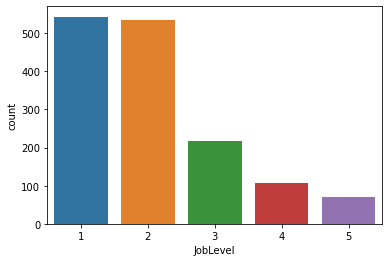

In [54]:
sns.countplot(df['JobLevel'])
df['JobLevel'].value_counts()

In [55]:
# There are 5 job levels. 
# high positons have less number of employee
# Majority of the employees work in lower levels(i.e., 1 and 2).

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

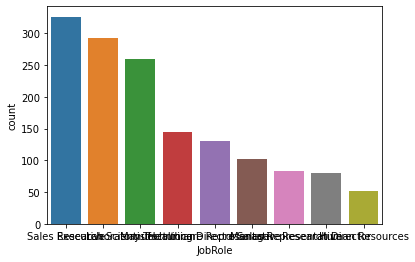

In [56]:
sns.countplot(df['JobRole'])
df['JobRole'].value_counts()

In [57]:
# There are 9 job roles. Most of them are of Sales Executive, Research Scientist and Laboratory Technician 
# Only 52 are of Human Resources.

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64

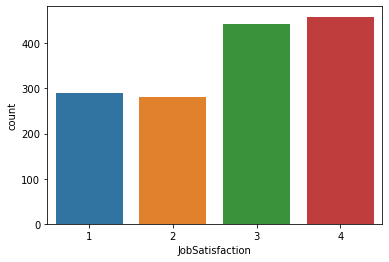

In [58]:
sns.countplot(df['JobSatisfaction'])
df['JobSatisfaction'].value_counts()

In [59]:
# the info that we can infer from here is that, there are 4 levels of job satisfaction. 
# Most of the employees are satified with there job 
# around 569(289+280) people show low to satisfactory opinion on there job satisfaction, which is a large number.

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

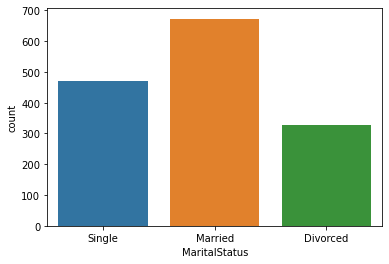

In [60]:
sns.countplot(df['MaritalStatus'])
df['MaritalStatus'].value_counts()

In [61]:
# Most of the employees are Married and a lot of them are divorced.

No     1054
Yes     416
Name: OverTime, dtype: int64

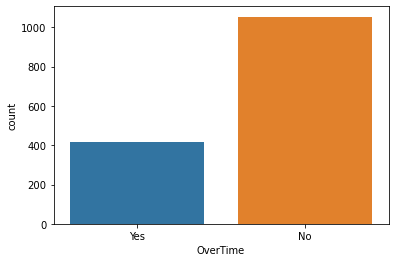

In [62]:
sns.countplot(df['OverTime'])
df['OverTime'].value_counts()

In [63]:
# Only 416 people work overtime, maybe they are in need of money or few number of acquaintances



3    1244
4     226
Name: PerformanceRating, dtype: int64

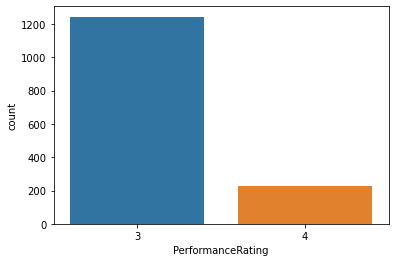

In [64]:
sns.countplot(df['PerformanceRating'])
df['PerformanceRating'].value_counts()

In [65]:
# There are only two categories 3 and 4, it could be that none of the employees have performance in level 1 or 2.
# So most of them have a decent performance rating

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64

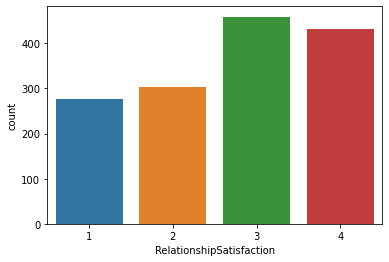

In [66]:
sns.countplot(df['RelationshipSatisfaction'])
df['RelationshipSatisfaction'].value_counts()

In [67]:
# Most of the people are satisfied with there relationship.

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64

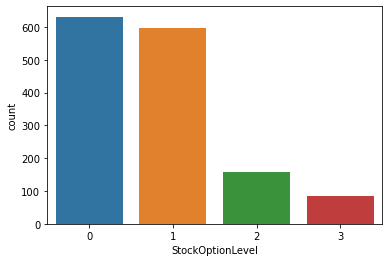

In [68]:
sns.countplot(df['StockOptionLevel'])
df['StockOptionLevel'].value_counts()

In [69]:
# The info that we can infer from here is that Most of the employees are holding very few stocks
# the number of employees with highest stocks are very few.

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64

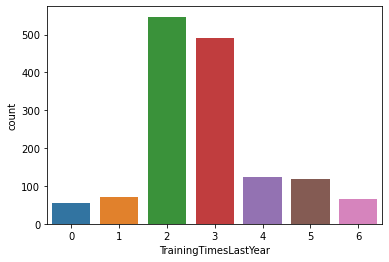

In [70]:
sns.countplot(df['TrainingTimesLastYear'])
df['TrainingTimesLastYear'].value_counts()

In [71]:
# Most of the employees train 2 to 3 times a year while no. of employees training rigorously or doing none of the training are very few in numbers.
# The number of people taking trainings for 4/5/6 are also few

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64

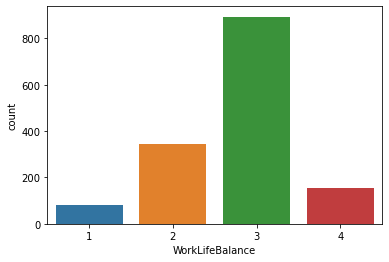

In [72]:
sns.countplot(df['WorkLifeBalance'])
df['WorkLifeBalance'].value_counts()

In [73]:
# Majority of the employees have there life balance at level 3
# There are 344 employees at level 2 in life balance even they can work to reach level3
# there are around 80 employees who need to work on this. Only 153 employees have there life completely balanced.

Maximum 60
Minimum 18


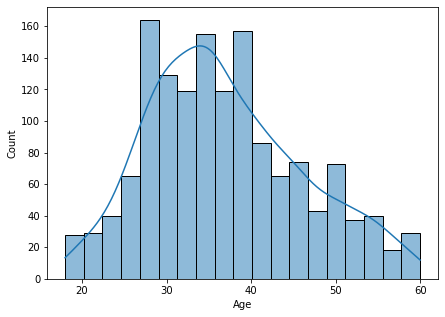

In [74]:
plt.figure(figsize=(7,5))
sns.histplot(df['Age'],kde=True)
print('Maximum',df['Age'].max())
print('Minimum',df['Age'].min())

In [75]:
# This is the histogram for the column Age
# We can infer the following
# The minimum age of employees is 18
# The maximum age of employees is 60
# There is low skewness, data is almost normally distributed. 
# Majority of the employees working have there age in the range 28 to 40. 
# Employees as young as 18 start working in the company and the retirement age seems to be 60.

Maximum 1499
Minimum 102


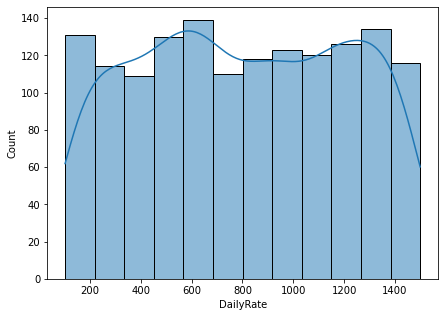

In [76]:
plt.figure(figsize=(7,5))
sns.histplot(df['DailyRate'],kde=True)
print('Maximum',df['DailyRate'].max())
print('Minimum',df['DailyRate'].min())

In [77]:
# Distribution of employees is even for Daily Rate. 
# There is low skewness, data is almost normally distributed. 
# Daily rate of employees range from 102 to 1499.

Maximum 29
Minimum 1


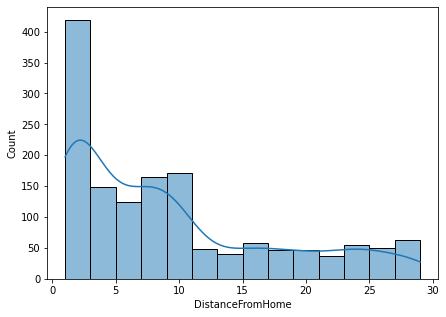

In [78]:
plt.figure(figsize=(7,5))
sns.histplot(df['DistanceFromHome'],kde=True)
print('Maximum',df['DistanceFromHome'].max())
print('Minimum',df['DistanceFromHome'].min())

In [79]:
# The minimun distance from home for an employee is 1km whereas the maximum distance is 29kms
# Most of the employees live less than 3 kms from the office. 
# There are around 100 employees who travel more than 25kms to reach office. 
# Data is highly skewed to the right with mean greater than the median.

Maximum 100
Minimum 30


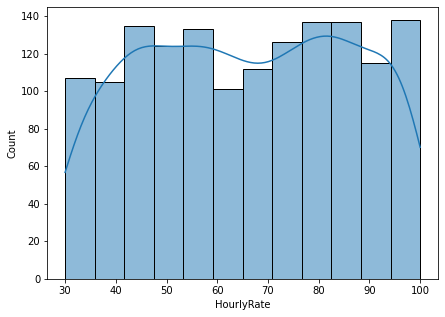

In [80]:
plt.figure(figsize=(7,5))
sns.histplot(df['HourlyRate'],kde=True)
print('Maximum',df['HourlyRate'].max())
print('Minimum',df['HourlyRate'].min())

In [81]:
# Distribution of employees is even for hourly rate. 
# Data follows gaussian distribution. Hourly rate of employees ranges from 30 to 100.

Maximum 19999
Minimum 1009


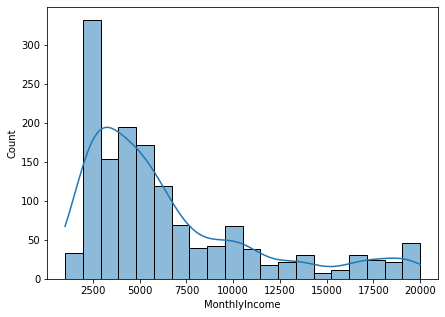

In [82]:
plt.figure(figsize=(7,5))
sns.histplot(df['MonthlyIncome'],kde=True)
print('Maximum',df['MonthlyIncome'].max())
print('Minimum',df['MonthlyIncome'].min())

In [83]:
# Employees get income from 1009 to 19999 as seen in the range of minimum and maximum. 
# Majority of the employees get income around 2500. 
# There are less than 50 employees getting income of the highest level. Data is right skewed with mean greater than the median.

Maximum 26999
Minimum 2094


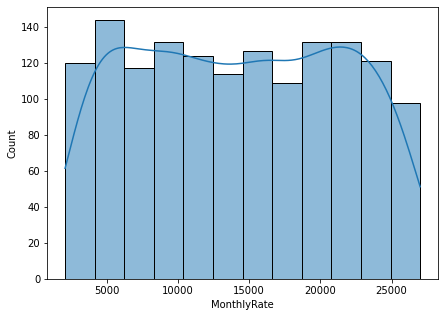

In [84]:
plt.figure(figsize=(7,5))
sns.histplot(df['MonthlyRate'],kde=True)
print('Maximum',df['MonthlyRate'].max())
print('Minimum',df['MonthlyRate'].min())

In [85]:
# There is low skewness in the data.
# Monthly rate range from 2094 to 25999 with number of employees showing very less variance.

Maximum 25
Minimum 11


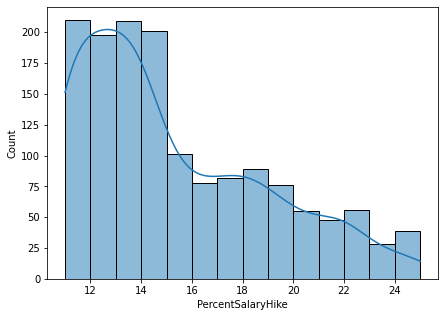

In [86]:
plt.figure(figsize=(7,5))
sns.histplot(df['PercentSalaryHike'],kde=True)
print('Maximum',df['PercentSalaryHike'].max())
print('Minimum',df['PercentSalaryHike'].min())

In [87]:
# Most employees are given percent salary hike in the range of 11 to 15 percent 
# few are also given hike around 24 to 25 percent. 
# Feature is skewed towards right having mean greater than median.

Maximum 40
Minimum 0


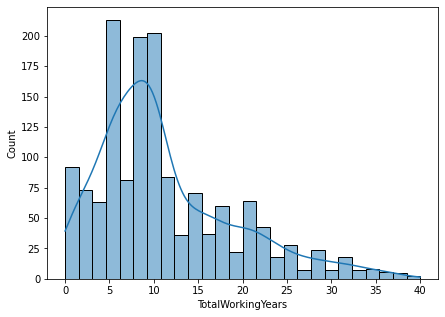

In [88]:
plt.figure(figsize=(7,5))
sns.histplot(df['TotalWorkingYears'],kde=True)
print('Maximum',df['TotalWorkingYears'].max())
print('Minimum',df['TotalWorkingYears'].min())

In [89]:
# here the minimum total working years is 0 and maximun total working years is 40.
# Employees are working in the company for more than 30 years 
# the majority of employees working in the company have total years of working in the range 5 to 11 years. 
# Feature shows skeweness which needs to be handled.

Maximum 40
Minimum 0


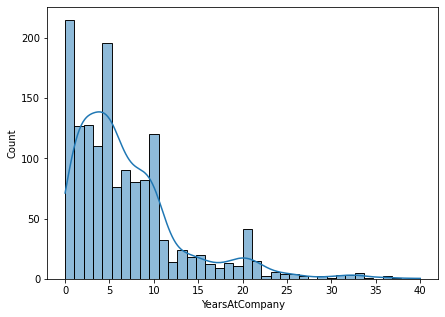

In [90]:
plt.figure(figsize=(7,5))
sns.histplot(df['YearsAtCompany'],kde=True)
print('Maximum',df['YearsAtCompany'].max())
print('Minimum',df['YearsAtCompany'].min())


In [91]:
# here the minimum yearsatcompany is 0 years 
# Maximum years at company is 40 years
# There very few employees who have been in the company for more than 30 years. 
# Majority of the employees consist of new employees who have been in the company for only an year. 
# Data is highly skewed. 
# Skewness is towards right.
# The skewness must be treated.

In [92]:
# Employees that studied in HR, Marketing and Technical had a higher attrition rate than all the others.
#Sales representatives had a tremendously high attrition rate, whilst managers, directors and people in the more senior roles tended to remain in the company’s workforce.
#Attrition was slightly higher for males.
#A ‘sweet spot’ for employees that were in their third fourth or fifth job was noticed. The attrition rate in these cases was remarkably low.
#Singles were more likely to leave the company than divorced and married employees.
#Attrition was slightly less in the R&D department when compared to the sales and HR departments.
#Employees that were not satisfied in the company, that were very unhappy in their team, that did not have a healthy work life balance, and that were not happy with their work environment were more likely to leave. In all cases we noticed that the attrition rate for ‘very unhappy’ employees was around double than for the other cases.
#There was a preferred stock option scheme, the option number 3. The attrition rate for this scheme was much lower than for the other three.
#Training was also a very important factor. We noticed that the attrition rate for the employees that received no training was around 25%, compared to values that range from 10% to 15% for employees that did receive some training.
#The performance rating had no effect on attrition. As we noticed before, all employees were graded as either 3 or 4. In this analysis we noticed that turnover was practically the same in both cases. In addition, we noticed that a only a small percentage (12%) of the total workforce were rated a grade 4.
#Employees that were not involved in their work tended to leave.
#Overtime had a negative effect on attrition. We noticed that employees were more likely to leave when they did overtime.
#A similar situation was encountered when travel was considered. Employees that travelled frequently were more likely to leave.

# Bi-Variant Analysis

<AxesSubplot:xlabel='Attrition', ylabel='Age'>

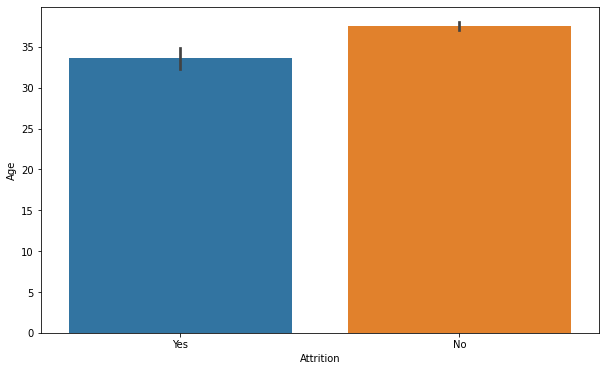

In [93]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'Attrition', y = 'Age', data = df)

In [94]:
# As age increases attrition decreases as people look for stability in their job.

<AxesSubplot:xlabel='Attrition', ylabel='Age'>

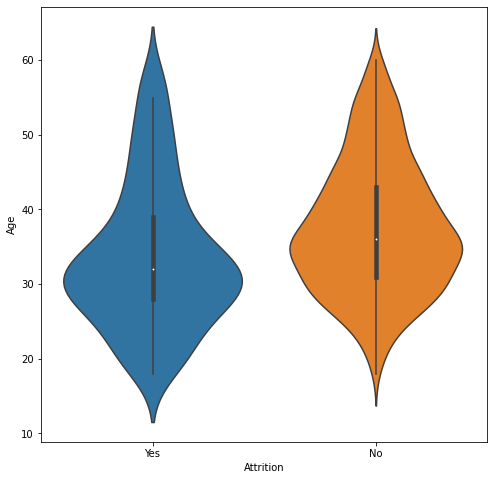

In [95]:
# To get more clearer conclusion on the above Age versus Attrition, we can go for violin plot

plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='Age',data=df)

In [96]:
# Attrition is maximum in the range 27 to 33. As age increases attrition decreases as people look for stability in their job.

<AxesSubplot:xlabel='Attrition', ylabel='Education'>

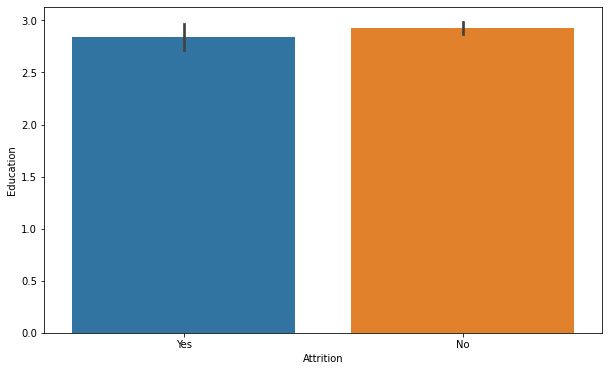

In [97]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'Attrition', y = 'Education', data = df)

In [98]:
# Cant infer much from here wrt Attrition vs Education

<AxesSubplot:xlabel='Attrition', ylabel='Education'>

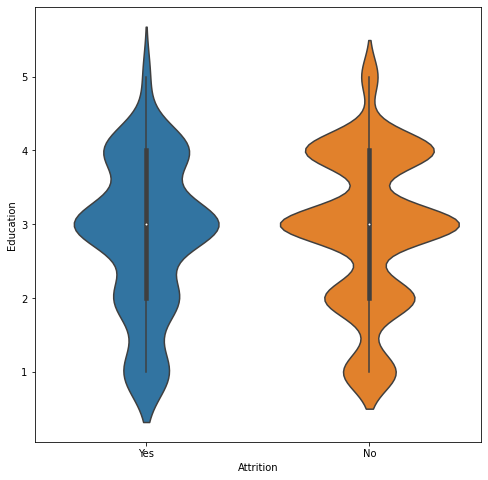

In [99]:

plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='Education',data=df)

In [100]:
# People with highest level of education has shown more attrition than any other educational level.

<AxesSubplot:xlabel='Attrition', ylabel='BusinessTravel'>

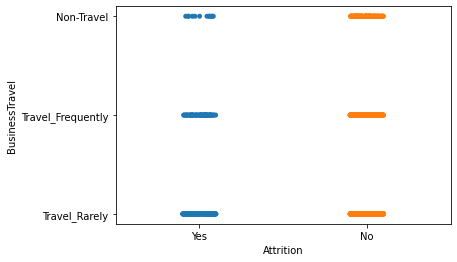

In [101]:
sns.stripplot(x='Attrition',y='BusinessTravel',data=df)

In [102]:
# Employees who do not travel on bussinesses tend to attrit more.

<AxesSubplot:xlabel='Attrition', ylabel='Education'>

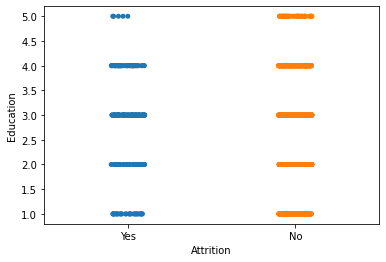

In [103]:
sns.stripplot(x='Attrition',y='Education',data=df)

In [104]:
# Here we can clearly see that the people with highest level of education has shown more attrition than any other level

<AxesSubplot:xlabel='Attrition', ylabel='EducationField'>

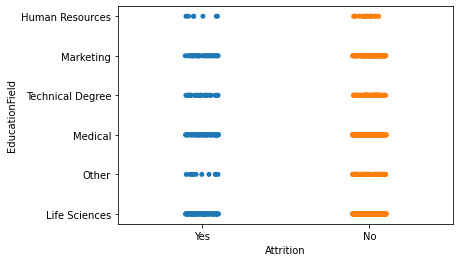

In [105]:
sns.stripplot(x='Attrition',y='EducationField',data=df)

In [106]:
# from here we can clearly infer that Employees under Human resources and other education field tend to attrit more than employees belonging to any other educational field.

<AxesSubplot:xlabel='Attrition', ylabel='Gender'>

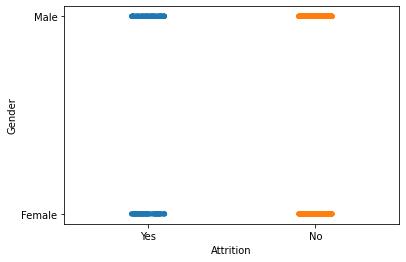

In [107]:
sns.stripplot(x='Attrition',y='Gender',data=df)

In [108]:
# There is no dependency on gender for attrition.

<AxesSubplot:xlabel='Attrition', ylabel='JobInvolvement'>

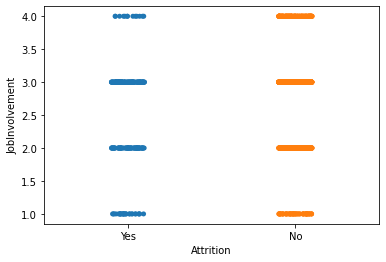

In [109]:
sns.stripplot(x='Attrition',y='JobInvolvement',data=df)

In [110]:
# Employees who are involved too much in work or too less tend to attrit more than employees who lie between these ranges.

<AxesSubplot:xlabel='Attrition', ylabel='JobLevel'>

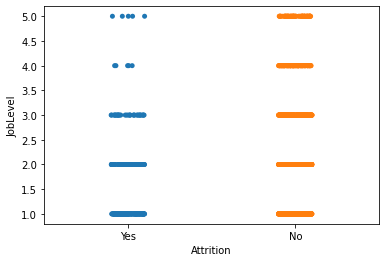

In [111]:
sns.stripplot(x='Attrition',y='JobLevel',data=df)

In [112]:
# Employees at higher job levels tend to attrit more than who are at lower level.

<AxesSubplot:xlabel='Attrition', ylabel='JobRole'>

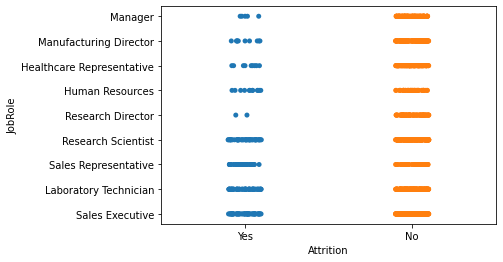

In [113]:
sns.stripplot(x='Attrition',y='JobRole',data=df)

In [114]:
# Research Directors show the most attrition followed by Managers and human resources. 
# While the Sales Executives show no attrition.

<AxesSubplot:xlabel='Attrition', ylabel='MaritalStatus'>

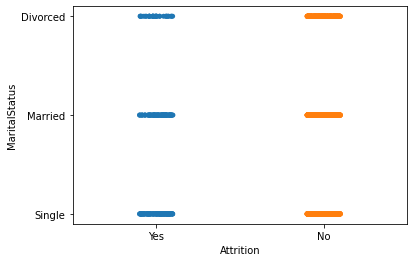

In [115]:
sns.stripplot(x='Attrition',y='MaritalStatus',data=df)

In [116]:
# Divorced employees show more attrition than single or Married ones.



<AxesSubplot:xlabel='Attrition', ylabel='StockOptionLevel'>

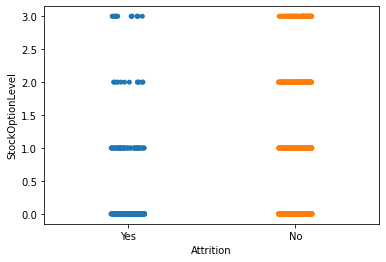

In [117]:
sns.stripplot(x='Attrition',y='StockOptionLevel',data=df)

In [118]:
# Employees in higher levels of stock option show more attrition than eployees in the lower levels.

<AxesSubplot:xlabel='Attrition', ylabel='TrainingTimesLastYear'>

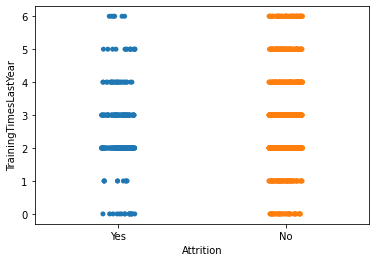

In [119]:
sns.stripplot(x='Attrition',y='TrainingTimesLastYear',data=df)

In [120]:
# Employees who train extensively or very less both tend to attrit.
# While employees training 2 to 3 times a year show no attrition.

<AxesSubplot:xlabel='Attrition', ylabel='DailyRate'>

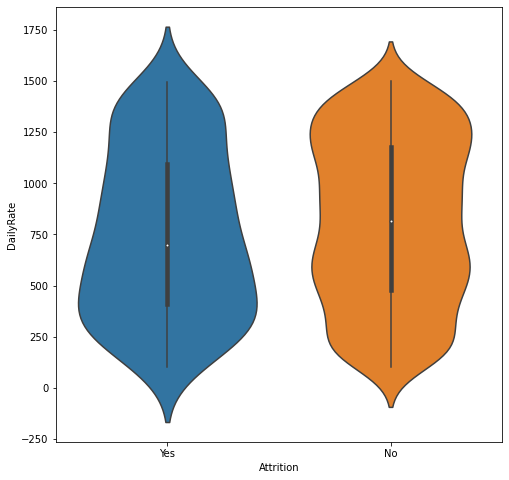

In [121]:
plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='DailyRate',data=df)

In [122]:
# The info that we an infer from here is that, Employees show more attrition at lower daily rate.
# attrition keeps on decreasing as the daily rate increases and people become economically stable.

<AxesSubplot:xlabel='Attrition', ylabel='DistanceFromHome'>

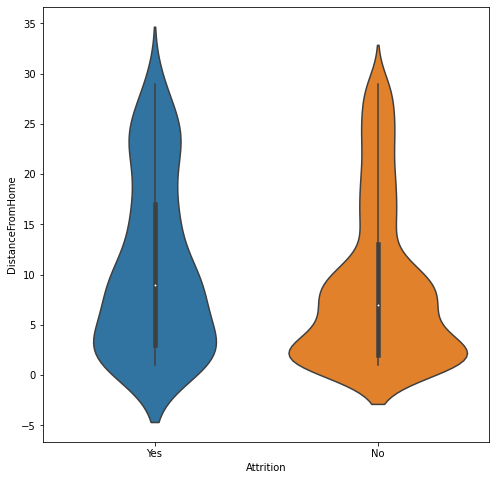

In [123]:
plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='DistanceFromHome',data=df)

In [124]:
# Here we can see that even as the distance increases the attrition decreases showing that the employees will attire even 
# if the distance to workplace is less

<AxesSubplot:xlabel='Attrition', ylabel='MonthlyIncome'>

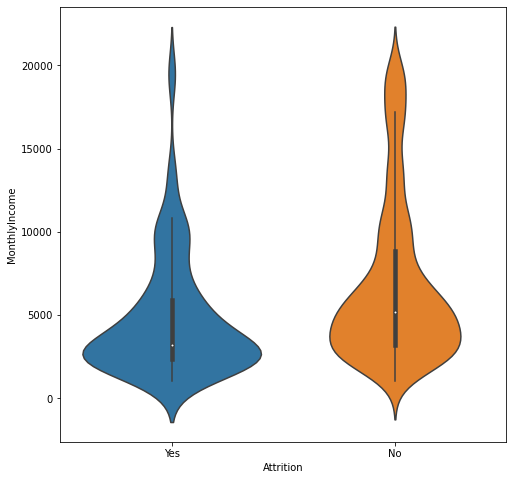

In [125]:
plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='MonthlyIncome',data=df)

In [126]:
# As we can see, attrition is very high at low monthly income especially below 5000.
# As income increases chances of employee leaving becomes very low because they are more satisfied compared to the ones with the
# lesser pay

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

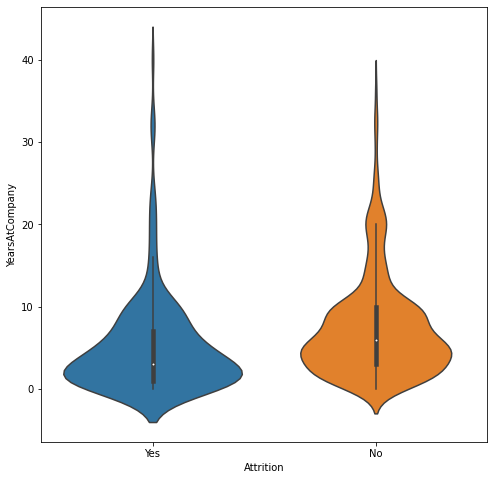

In [127]:
plt.figure(figsize=(8,8))
sns.violinplot(x='Attrition',y='YearsAtCompany',data=df)

In [128]:
# There is high attrition with the new employees.
# new employees tend to change jobs for better pay and better career choices. 
# Attrition is especially high below 5 years. 
# As an employee works for more than 15 years in a company, chances ofthe employee leaving the company becomes very very steep.
# This also shows the satisfaction of the employees who has served longer periods

# Data Manipulation

In [129]:
# Firstly importing Label Encoder
# Label Encoder is used here to convert all the columns with String values into numerical values

from sklearn.preprocessing import LabelEncoder

labelencoder=LabelEncoder()
for column in df1.columns:
    df1[column] = labelencoder.fit_transform(df1[column])

In [130]:
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,1,2,2,1,0,7,2,0,1
1,0,1,1,1,1,6,1,0,0
2,1,2,1,4,1,2,2,0,1
3,0,1,1,1,0,6,1,0,1
4,0,2,1,3,1,2,1,0,0
...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0,0
1466,0,2,1,3,1,0,1,0,0
1467,0,2,1,1,1,4,1,0,1
1468,0,1,2,3,1,7,1,0,0


In [131]:
# Now here using LabelEncoder we are converting all the String values into numeric 

In [132]:
# Since we infered from above analysis that df['Over18'] has one unique values and that doesn't help in our predictions
# We had already dropped it and since combine function would be used to update the dataframe after encoding we would again see this column
# in our dataframe, lets drop it here

In [133]:
df1.drop(['Over18'],axis=1,inplace=True)

In [134]:
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,1,2,2,1,0,7,2,1
1,0,1,1,1,1,6,1,0
2,1,2,1,4,1,2,2,1
3,0,1,1,1,0,6,1,1
4,0,2,1,3,1,2,1,0
...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0
1466,0,2,1,3,1,0,1,0
1467,0,2,1,1,1,4,1,1
1468,0,1,2,3,1,7,1,0


In [135]:
# Now we see that we have 8 columns and that Over18 is dropped , so now we can proceed with combining df1 and df and create new_df

In [136]:
# Now trying to combine and overwrite the string values in df to numeric values from df1

df_new = df1.combine_first(df)
display(df_new)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1,2,1102.0,2,1.0,2.0,1,2.0,0,...,3.0,1.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49.0,0,1,279.0,1,8.0,1.0,1,3.0,1,...,4.0,4.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37.0,1,2,1373.0,1,2.0,2.0,4,4.0,1,...,3.0,2.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33.0,0,1,1392.0,1,3.0,4.0,1,4.0,0,...,3.0,3.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27.0,0,2,591.0,1,2.0,1.0,3,1.0,1,...,3.0,4.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,0,1,884.0,1,23.0,2.0,3,3.0,1,...,3.0,3.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39.0,0,2,613.0,1,6.0,1.0,3,4.0,1,...,3.0,1.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27.0,0,2,155.0,1,4.0,3.0,1,2.0,1,...,4.0,2.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49.0,0,1,1023.0,2,2.0,3.0,3,4.0,1,...,3.0,4.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


In [137]:
# We can see that our new dataframe(df_new) has all the string values updated to numeric while combining df1 and df.

# Multi-Variant Analysis

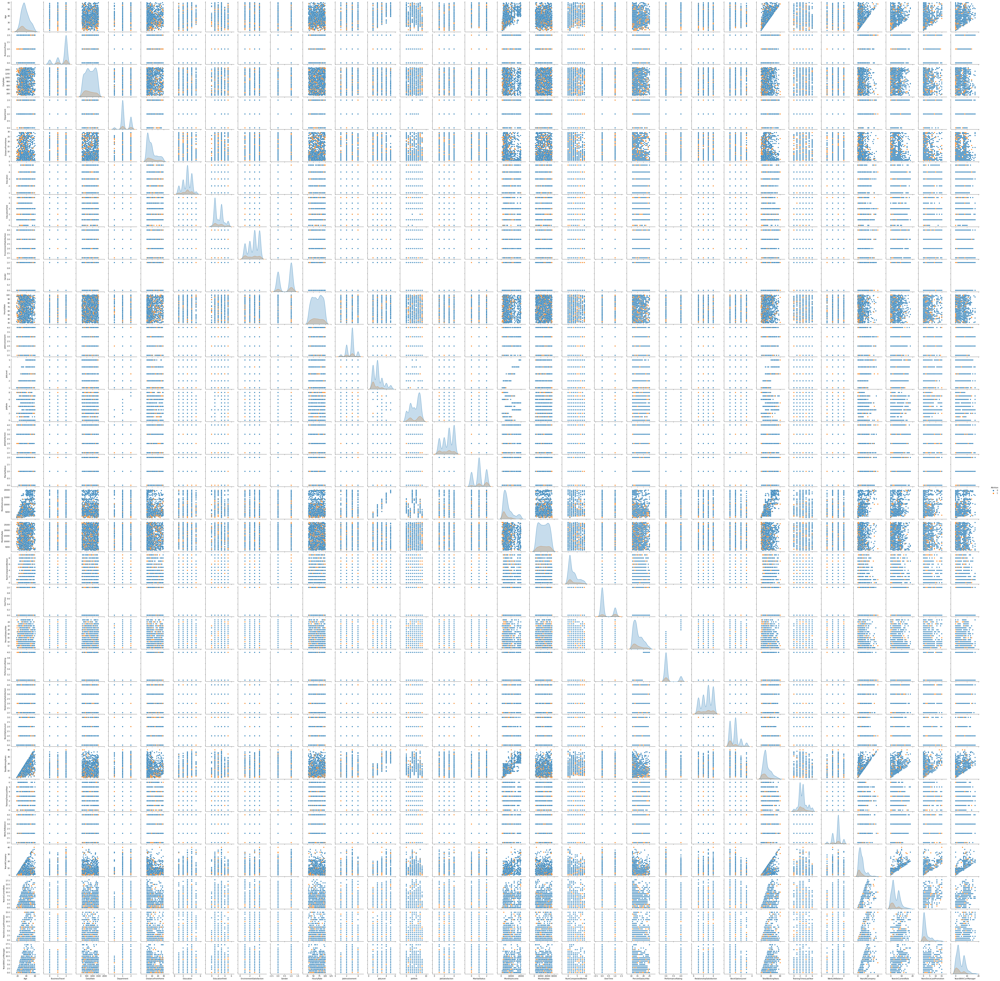

In [138]:
sns.pairplot(df_new,hue="Attrition")

<AxesSubplot:>

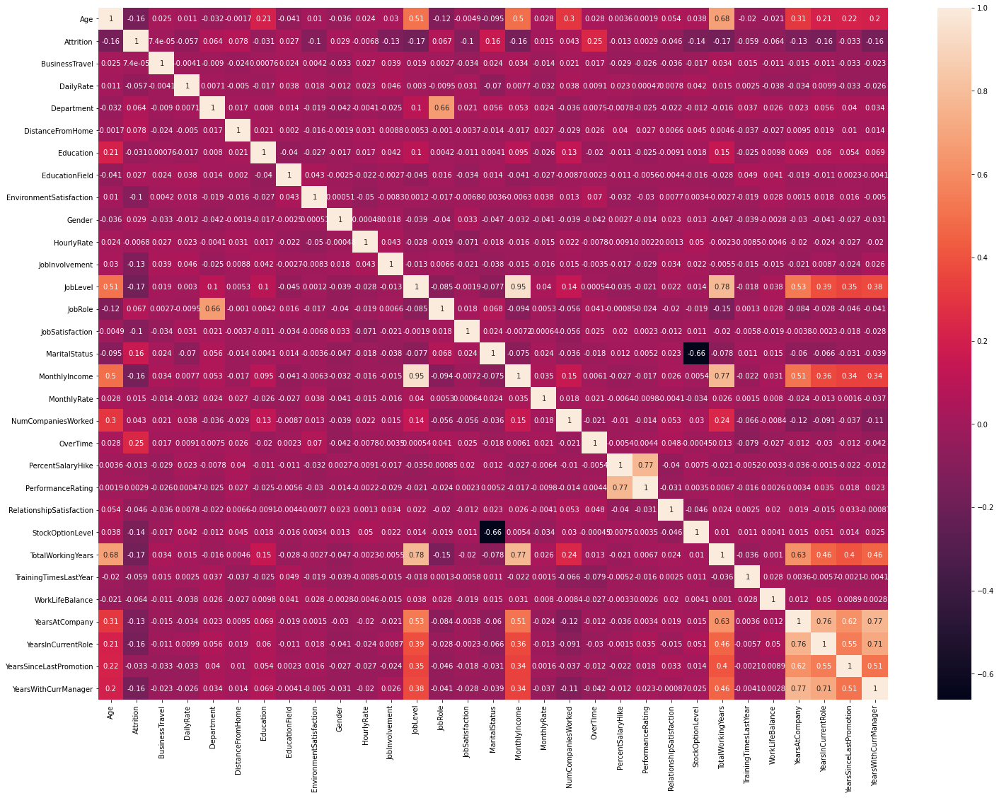

In [139]:
plt.figure(figsize=(25,18))
sns.heatmap(df_new.corr(),annot=True)

In [140]:
# From the heatmap we can infer that the columns Overtime, Marital status has high positive correlation compared to all other 
# columns
# The columns age, jobelevel, monthlyincome, total working hours, YearsInCurrentRole and YearsWithCurrent manager are negatively
# correlated with the target column.
# The columns HourlyRate and Performance rating are weakly correlated.

In [141]:
# As infered from the heatmap, let's remove the columns that are very weakly correlated with the target column
df_new.drop(['HourlyRate','PerformanceRating'],axis=1,inplace=True)

In [142]:
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1,2,1102.0,2,1.0,2.0,1,2.0,0,...,11.0,1.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49.0,0,1,279.0,1,8.0,1.0,1,3.0,1,...,23.0,4.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37.0,1,2,1373.0,1,2.0,2.0,4,4.0,1,...,15.0,2.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33.0,0,1,1392.0,1,3.0,4.0,1,4.0,0,...,11.0,3.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27.0,0,2,591.0,1,2.0,1.0,3,1.0,1,...,12.0,4.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,0,1,884.0,1,23.0,2.0,3,3.0,1,...,17.0,3.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39.0,0,2,613.0,1,6.0,1.0,3,4.0,1,...,15.0,1.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27.0,0,2,155.0,1,4.0,3.0,1,2.0,1,...,20.0,2.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49.0,0,1,1023.0,2,2.0,3.0,3,4.0,1,...,14.0,4.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


In [143]:
# Since we have dropped two more columns , now we see that there are 29 columns.

In [144]:
cor = df_new.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,0.010146,-0.036311,...,0.003634,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.103369,0.029453,...,-0.013478,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,0.004174,-0.032981,...,-0.029377,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,0.018355,-0.011716,...,0.022704,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.019395,-0.041583,...,-0.007840,-0.022414,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,-0.016075,-0.001851,...,0.040235,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,-0.027128,-0.016547,...,-0.011111,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,0.043163,-0.002504,...,-0.011214,-0.004378,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,1.000000,0.000508,...,-0.031701,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.041583,-0.001851,-0.016547,-0.002504,0.000508,1.000000,...,0.002733,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599


In [145]:
# This is the correlation values for our dataset which we saw visually using the heatmap
# We can clearly see that the column BusinessTravel has very very less correlation with the target column
# So very very less correlation means that it doesnot help anyway in our predictions
# Hence trying to drop it here

In [146]:
df_new.drop(['BusinessTravel'],axis=1,inplace=True)

In [147]:
df_new

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1,1102.0,2,1.0,2.0,1,2.0,0,3.0,...,11.0,1.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49.0,0,279.0,1,8.0,1.0,1,3.0,1,2.0,...,23.0,4.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37.0,1,1373.0,1,2.0,2.0,4,4.0,1,2.0,...,15.0,2.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33.0,0,1392.0,1,3.0,4.0,1,4.0,0,3.0,...,11.0,3.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27.0,0,591.0,1,2.0,1.0,3,1.0,1,3.0,...,12.0,4.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,0,884.0,1,23.0,2.0,3,3.0,1,4.0,...,17.0,3.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39.0,0,613.0,1,6.0,1.0,3,4.0,1,2.0,...,15.0,1.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27.0,0,155.0,1,4.0,3.0,1,2.0,1,4.0,...,20.0,2.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49.0,0,1023.0,2,2.0,3.0,3,4.0,1,2.0,...,14.0,4.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


In [148]:
# So now again since we have dropped one more column , the column no. is updated to 28

In [149]:
# Representing which columns have positive and negative correlations with the target column

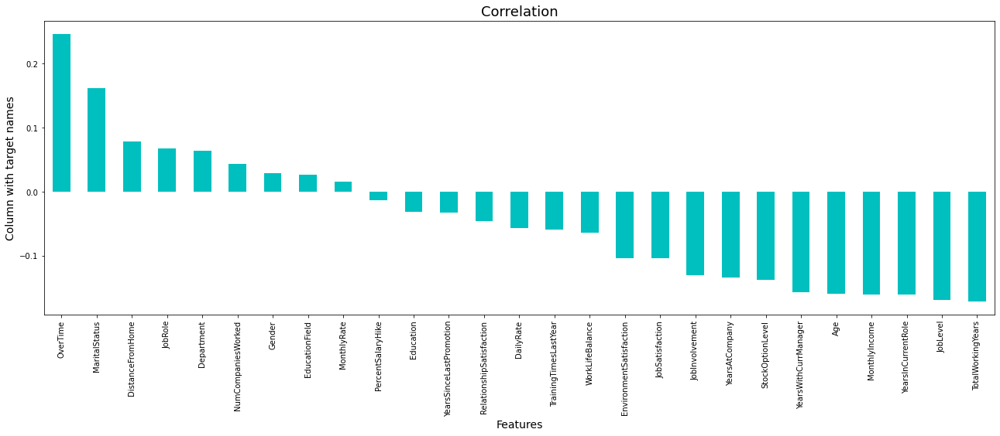

In [150]:
plt.figure(figsize=(22,7))
df_new.corr()['Attrition'].sort_values(ascending=False).drop(["Attrition"]).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('Column with target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

In [151]:
# This gives a more clearer picture comapred to heatmap onto which features are positively and which features are negatively correlated.

In [152]:
# Checking for the presence of outliers for our modified dataset individually

<AxesSubplot:xlabel='MaritalStatus'>

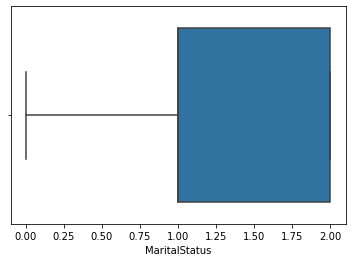

In [153]:
sns.boxplot(df_new["MaritalStatus"])

<AxesSubplot:xlabel='DistanceFromHome'>

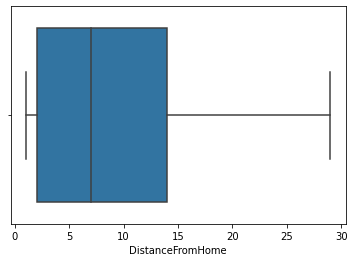

In [154]:
sns.boxplot(df_new["DistanceFromHome"])

<AxesSubplot:xlabel='JobRole'>

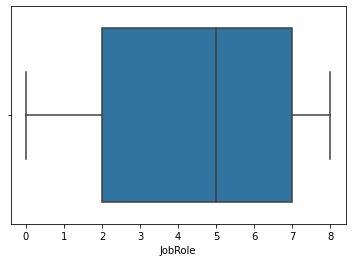

In [155]:
sns.boxplot(df_new["JobRole"])

<AxesSubplot:xlabel='Department'>

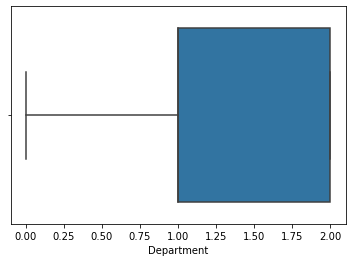

In [156]:
sns.boxplot(df_new["Department"])

<AxesSubplot:xlabel='NumCompaniesWorked'>

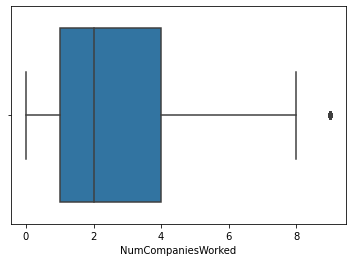

In [157]:
sns.boxplot(df_new["NumCompaniesWorked"])

<AxesSubplot:xlabel='Gender'>

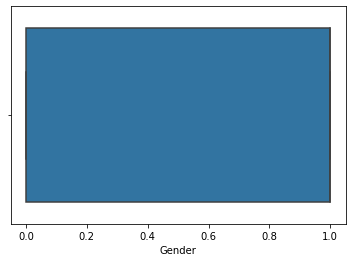

In [158]:
sns.boxplot(df_new["Gender"])

<AxesSubplot:xlabel='EducationField'>

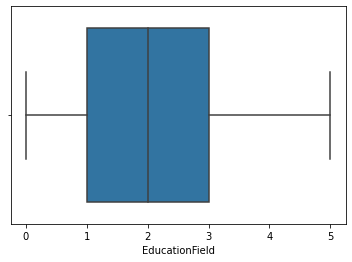

In [159]:
sns.boxplot(df_new["EducationField"])

<AxesSubplot:xlabel='MonthlyRate'>

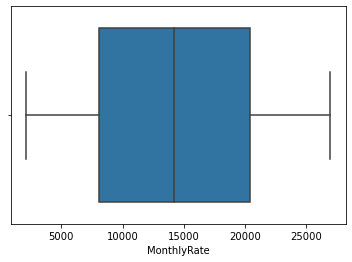

In [160]:
sns.boxplot(df_new["MonthlyRate"])

<AxesSubplot:xlabel='PercentSalaryHike'>

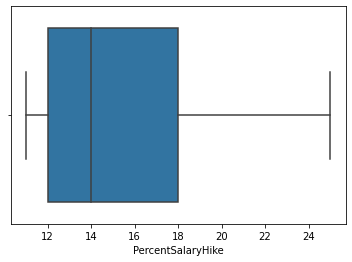

In [161]:
sns.boxplot(df_new["PercentSalaryHike"])

<AxesSubplot:xlabel='Education'>

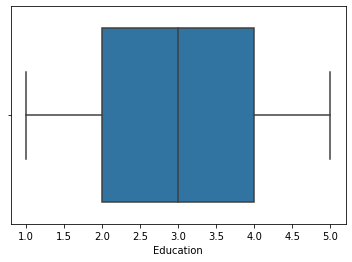

In [162]:
sns.boxplot(df_new["Education"])

<AxesSubplot:xlabel='YearsSinceLastPromotion'>

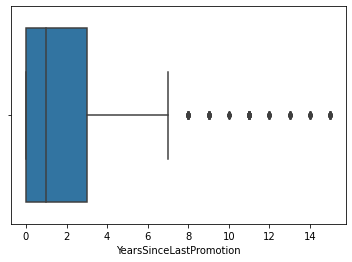

In [163]:
sns.boxplot(df_new["YearsSinceLastPromotion"])

In [164]:
# There is presence of outliers here compared other columns till now and it needs to be treated

<AxesSubplot:xlabel='RelationshipSatisfaction'>

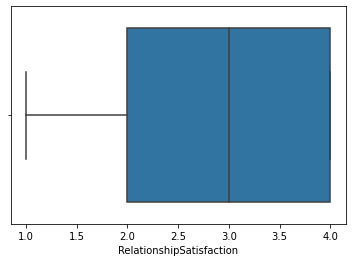

In [165]:
sns.boxplot(df_new["RelationshipSatisfaction"])

<AxesSubplot:xlabel='DailyRate'>

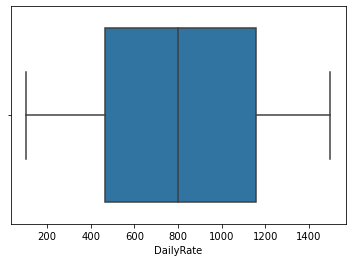

In [166]:
sns.boxplot(df_new["DailyRate"])

<AxesSubplot:xlabel='TrainingTimesLastYear'>

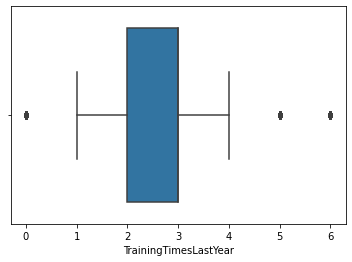

In [167]:
sns.boxplot(df_new["TrainingTimesLastYear"])

In [168]:
# There is a presence of outliers here

<AxesSubplot:xlabel='WorkLifeBalance'>

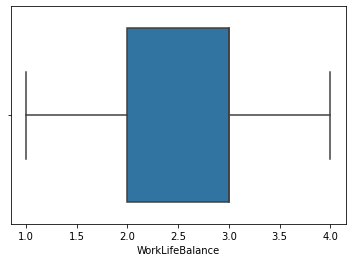

In [169]:
sns.boxplot(df_new["WorkLifeBalance"])

<AxesSubplot:xlabel='EnvironmentSatisfaction'>

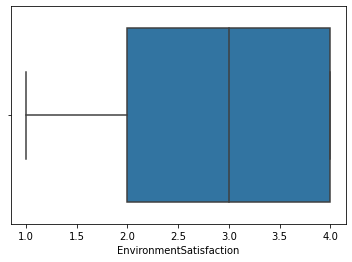

In [170]:
sns.boxplot(df_new["EnvironmentSatisfaction"])

<AxesSubplot:xlabel='JobSatisfaction'>

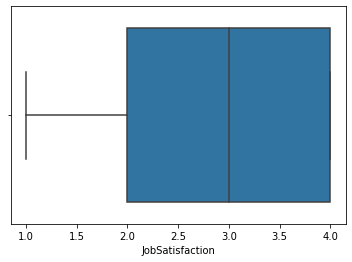

In [171]:
sns.boxplot(df_new["JobSatisfaction"])

<AxesSubplot:xlabel='JobInvolvement'>

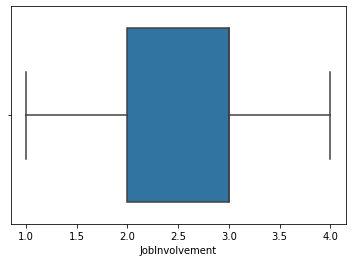

In [172]:
sns.boxplot(df_new["JobInvolvement"])

<AxesSubplot:xlabel='YearsAtCompany'>

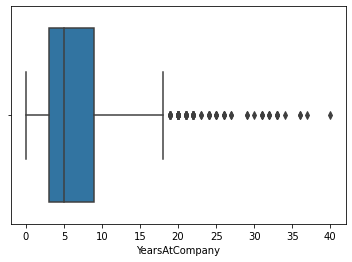

In [173]:
sns.boxplot(df_new["YearsAtCompany"])

In [174]:
# We can see the presence of outliers here

<AxesSubplot:xlabel='StockOptionLevel'>

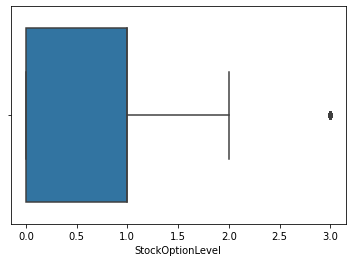

In [175]:
sns.boxplot(df_new["StockOptionLevel"])

<AxesSubplot:xlabel='YearsWithCurrManager'>

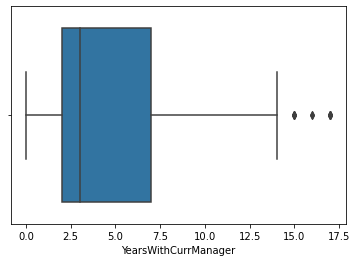

In [176]:
sns.boxplot(df_new["YearsWithCurrManager"])

In [177]:
# Presence of few outliers here

<AxesSubplot:xlabel='Age'>

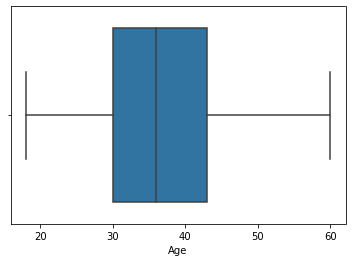

In [178]:
sns.boxplot(df_new["Age"])

<AxesSubplot:xlabel='MonthlyIncome'>

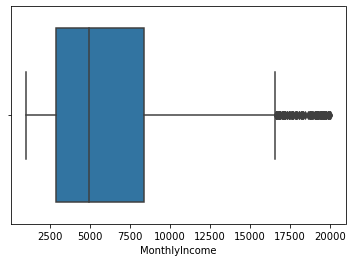

In [179]:
sns.boxplot(df_new["MonthlyIncome"])

In [180]:
# Here the presence of outliers is very evident

<AxesSubplot:xlabel='YearsInCurrentRole'>

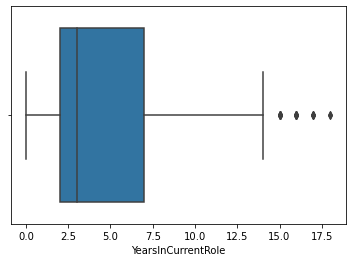

In [181]:
sns.boxplot(df_new["YearsInCurrentRole"])

In [182]:
# We see the presence of outliers here

<AxesSubplot:xlabel='JobLevel'>

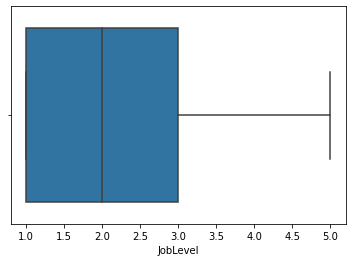

In [183]:
sns.boxplot(df_new["JobLevel"])

<AxesSubplot:xlabel='TotalWorkingYears'>

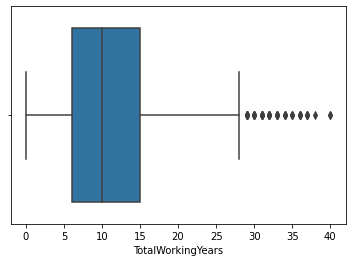

In [184]:
sns.boxplot(df_new["TotalWorkingYears"])

In [185]:
# Presence of outliers

In [186]:
# Let's check the level of skewness in our dataset

In [187]:
df_new.skew()

Age                         0.413286
Attrition                   1.844366
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.821128
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
Y

In [188]:
# We can see the presence of skewness in our data
# As we saw the presence of outliers and hence the skewness is present
# -(0.5) to +(0.5), the skewness within this range is acceptable
# We have skewness of few columns outside the above mentioned range and they need to be treated. The columns with high skewness 
# are "DistanceFromHome", "JobLevel", "MonthlyIncome", "NumCompaniesWorked","OverTime","PercentSalaryHike", "StockOptionLevel",
# "TotalWorkingYears", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager".
# The skewness has to be removed/reduced compartively.

# Considering to remove the outliers

In [222]:
df_new.shape

(1470, 28)

In [ ]:
# So this is the shape of our dataset before removing the outliers
# We have 1470 rows and 28 columns

In [218]:
from scipy.stats import zscore
z=np.abs(zscore(df_new))
threshold=3
np.where(z>3)

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
         123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
         218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
         401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
         561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
         677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
         875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
         962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
        1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
        1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
       dtype=int64),
 array([27, 26, 24, 26, 25, 26, 21, 21, 24, 26, 25, 26, 27, 21, 24, 26, 27,
        26, 21, 27, 24, 25, 26, 25, 27, 24, 26, 21, 24, 25, 26, 26, 27, 21,
        24, 24, 26, 26, 21, 25, 24, 24, 26, 24, 27, 26, 24, 21, 24, 26, 27,
        21

In [219]:
df_new_z=df_new[(z<3).all(axis=1)] # remove outliers
df_new_z


,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1,1102.0,2,1.0,2.0,1,2.0,0,3.0,...,11.0,1.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49.0,0,279.0,1,8.0,1.0,1,3.0,1,2.0,...,23.0,4.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37.0,1,1373.0,1,2.0,2.0,4,4.0,1,2.0,...,15.0,2.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33.0,0,1392.0,1,3.0,4.0,1,4.0,0,3.0,...,11.0,3.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27.0,0,591.0,1,2.0,1.0,3,1.0,1,3.0,...,12.0,4.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,0,884.0,1,23.0,2.0,3,3.0,1,4.0,...,17.0,3.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39.0,0,613.0,1,6.0,1.0,3,4.0,1,2.0,...,15.0,1.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27.0,0,155.0,1,4.0,3.0,1,2.0,1,4.0,...,20.0,2.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49.0,0,1023.0,2,2.0,3.0,3,4.0,1,2.0,...,14.0,4.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


In [220]:
df_new_z.shape  # info of data after removing outliers

(1387, 28)

In [223]:
# Calculating the percentage of data loss

In [224]:
Data_loss=((1470-1387)/1470)*100

In [225]:
Data_loss

5.646258503401361

In [226]:
# So here we can see that we have lost nearly 5.6 % of data after removing the outliers and is acceptable

In [227]:
df_new_z.skew()   # skewness is reduced comparitively

Age                         0.472280
Attrition                   1.805983
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
Y

In [228]:
df_new_z.describe() 

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,...,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000
mean,36.258111,0.165105,806.054074,1.260995,9.176640,2.896179,2.256669,2.725306,0.602019,2.733237,...,15.212689,2.703677,0.795963,10.302091,2.803893,2.762797,6.104542,3.867340,1.775775,3.800288
std,8.838767,0.371409,403.163183,0.526032,8.088602,1.023198,1.336205,1.090541,0.489658,0.709296,...,3.628516,1.081529,0.856710,6.699832,1.291737,0.705043,4.679161,3.244441,2.499533,3.258874
min,18.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,...,11.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,467.500000,1.000000,2.000000,2.000000,1.000000,2.000000,0.000000,2.000000,...,12.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,35.000000,0.000000,807.000000,1.000000,7.000000,3.000000,2.000000,3.000000,1.000000,3.000000,...,14.000000,3.000000,1.000000,9.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,42.000000,0.000000,1160.000000,2.000000,14.000000,4.000000,3.000000,4.000000,1.000000,3.000000,...,18.000000,4.000000,1.000000,13.000000,3.000000,3.000000,9.000000,7.000000,2.000000,7.000000
max,60.000000,1.000000,1498.000000,2.000000,29.000000,5.000000,5.000000,4.000000,1.000000,4.000000,...,25.000000,4.000000,3.000000,34.000000,6.000000,4.000000,25.000000,15.000000,11.000000,14.000000


In [270]:
# info on count,mean.std,min and max after dropping few columns, removing outliers and skewness
# Many of the columns standard deviation is reduced to 1 hence most of them are normally distributed

<AxesSubplot:xlabel='Attrition', ylabel='count'>

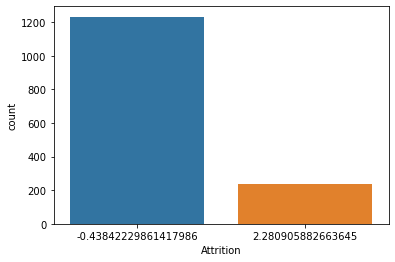

In [210]:
sns.countplot(df_new_z['Attrition'])

In [211]:
df_new_z['Attrition'].value_counts()

-0.438422    1233
 2.280906     237
Name: Attrition, dtype: int64

In [204]:
# Here we can clearly see that the classes 0 and 1 are not balanced
# Lets try to balance them first

In [282]:
# We need to split the data into X and y before we could try balancing the classes
# Splitting the dataset into X features and y label

X = df_new_z.drop(["Attrition"],axis=1)
y = df_new_z["Attrition"]

In [283]:
from sklearn.preprocessing import power_transform
power_transform(X,method='yeo-johnson',standardize=True,copy=True)

array([[ 0.61013332,  0.75061538,  1.37988121, ...,  0.29052433,
        -1.07353381,  0.58217664],
       [ 1.37182973, -1.34337244, -0.4734996 , ...,  1.0065754 ,
         0.19316755,  1.01807316],
       [ 0.18248603,  1.33708042, -0.4734996 , ..., -1.57181404,
        -1.07353381, -1.52842596],
       ...,
       [-1.0804891 , -1.75453754, -0.4734996 , ..., -0.39076907,
        -1.07353381,  0.01867962],
       [ 1.37182973,  0.57328582,  1.37988121, ...,  0.79376377,
        -1.07353381,  1.20578193],
       [-0.16377603, -0.37222758, -0.4734996 , ..., -0.01873824,
         0.19316755, -0.3478709 ]])

In [ ]:
# Skewness is handled using power_transform function

In [230]:
# Applying over-sampling to balance our classes

from imblearn import under_sampling 
from imblearn import over_sampling
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X,y = SM.fit_resample(X,y)

In [231]:
y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

In [ ]:
# Now that we see that our classes are balanced
# Class 0 has 1158 values
# Class 1 has 1158 values

In [232]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_)

[0.03666998 0.03087091 0.01830966 0.03929581 0.03126178 0.03218182
 0.05755084 0.024789   0.04503933 0.04427769 0.02955328 0.06142647
 0.02590913 0.0453089  0.03342546 0.03503323 0.02166697 0.02649588
 0.04301692 0.05629292 0.03768828 0.02893089 0.03497129 0.03680465
 0.04935591 0.03130462 0.04256836]


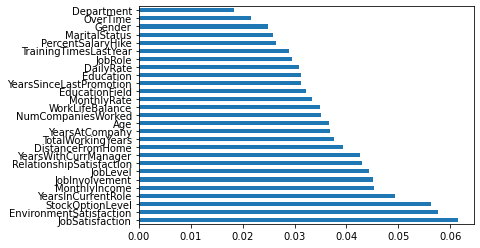

In [233]:
feat_importances = pd.Series(model.feature_importances_,index=X.columns)
feat_importances.nlargest(28).plot(kind='barh')
plt.show()

In [ ]:
# From this we can infer that the "Job Satisfaction", "Environment Satisfaction", and "StockOptionLevel" plays a very prominent
# role as features in predicting the Attrition.

In [234]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score

# Finding the best random state

In [235]:
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.30, random_state=i)
    mod = DecisionTreeClassifier()
    mod.fit(X_train,y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8661870503597122  on Random_state  141


In [ ]:
# The best random state is 141 for the best accuracy score of 0.866

In [236]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =maxRS) 

# Standardizing the data

In [237]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [ ]:
# performed train test split with the found best random state

In [239]:
DTC = DecisionTreeClassifier()
DTC.fit(X_train,y_train)

pred1 =DTC.predict(X_test )
acc1=classification_report(y_test,pred1)
print(acc1)

#confusion matrix


cf_matrix = confusion_matrix(y_test, pred1)
print(cf_matrix)

              precision    recall  f1-score   support

           0       0.80      0.22      0.35       350
           1       0.55      0.94      0.69       345

    accuracy                           0.58       695
   macro avg       0.67      0.58      0.52       695
weighted avg       0.68      0.58      0.52       695

[[ 78 272]
 [ 19 326]]


In [ ]:
# I have used classification report because it gives all the values of accuracy,precision, recall and f1-score
# Since the classes are balanced we can just take accuracy into consideration
# We are getting 58% Accuracy using DecisionTreeClassifier
# We can observe the confusion matrix as well

In [240]:
# Lets try to check the Accuracy using Random Forest
RFC=RandomForestClassifier()
RFC.fit(X_train,y_train)


pred1= RFC.predict(X_test)
acc1=classification_report(y_test,pred1)
print(acc1)

#confusion matrix

cf_matrix = confusion_matrix(y_test, pred1)
print(cf_matrix)

              precision    recall  f1-score   support

           0       0.95      0.42      0.58       350
           1       0.63      0.98      0.76       345

    accuracy                           0.70       695
   macro avg       0.79      0.70      0.67       695
weighted avg       0.79      0.70      0.67       695

[[148 202]
 [  8 337]]


In [ ]:
# I have used classification report because it gives all the values of accuracy,precision, recall and f1-score
# Since the classes are balanced we can just take accuracy into consideration
# The accuracy score obtained by Random Forest Classifier is 70%
# We can observe the confusion matrix as well

In [241]:
# Let's try to check the Accuracy using SupportVectorClassifier
SV=SVC()
SV.fit(X_train,y_train)
pred1=SV.predict(X_test)
acc=classification_report(y_test,pred1)
print(acc)

#confusion matrix

cf_matrix = confusion_matrix(y_test, pred1)
print(cf_matrix)


              precision    recall  f1-score   support

           0       0.89      0.86      0.88       350
           1       0.86      0.89      0.88       345

    accuracy                           0.88       695
   macro avg       0.88      0.88      0.88       695
weighted avg       0.88      0.88      0.88       695

[[302  48]
 [ 38 307]]


In [ ]:
# I have used classification report because it gives all the values of accuracy,precision, recall and f1-score
# Since the classes are balanced we can just take accuracy into consideration
# The accuracy score obtained by SupportVector Classifier is 88%
# We can observe the confusion matrix as well

In [242]:
sgd = SGDClassifier(penalty=None)
sgd.fit(X_train, y_train)

pred_sgd1 = sgd.predict(X_test)
acc1=classification_report(y_test,pred_sgd1)
print(acc1)  

#confusion matrix
cf_matrix = confusion_matrix(y_test, pred_sgd1)
print(cf_matrix)


              precision    recall  f1-score   support

           0       0.71      0.64      0.67       350
           1       0.67      0.74      0.70       345

    accuracy                           0.69       695
   macro avg       0.69      0.69      0.69       695
weighted avg       0.69      0.69      0.69       695

[[223 127]
 [ 89 256]]


In [ ]:
# I have used classification report because it gives all the values of accuracy,precision, recall and f1-score
# Since the classes are balanced we can just take accuracy into consideration
# The accuracy score obtained by SGD Classifier is 69%
# We can observe the confusion matrix as well

In [243]:
logreg = LogisticRegression(C=1e5)
logreg.fit(X_train,y_train)

y_pred1 = logreg.predict(X_test)
acc1=classification_report(y_test,y_pred1)
print(acc1)   

#confusion matrix

cf_matrix = confusion_matrix(y_test, y_pred1)
print(cf_matrix)

              precision    recall  f1-score   support

           0       0.75      0.73      0.74       350
           1       0.74      0.76      0.75       345

    accuracy                           0.74       695
   macro avg       0.74      0.74      0.74       695
weighted avg       0.74      0.74      0.74       695

[[256  94]
 [ 84 261]]


In [ ]:
# I have used classification report because it gives all the values of accuracy,precision, recall and f1-score
# Since the classes are balanced we can just take accuracy into consideration
# The accuracy score obtained by Logistic Regression model is 74%
# We can observe the confusion matrix as well

In [ ]:
# All these accuracy score may also be due to overfitting, so just can't decide with the accuracy score
# 1) Lets find the cross validation score first 
# 2) lets find the difference of accuracy score and cross validation score

# The model with the least difference is the best model


In [244]:
from sklearn.model_selection import cross_val_score

In [285]:
print(cross_val_score(DTC,X_test,y_test,cv=5).mean())

0.7755395683453237


In [ ]:
# The cross validation score for DecisionTreeClassifier is 78%

In [286]:
print(cross_val_score(RFC,X_test,y_test,cv=5).mean())

0.8719424460431654


In [ ]:
# The cross validation score for RandomForestClassifier is 87%

In [287]:
print(cross_val_score(SV,X_test,y_test,cv=5).mean())

0.8071942446043165


In [ ]:
# The cross validation score for SupportVector Classifier is 81%

In [288]:
print(cross_val_score(sgd,X_test,y_test,cv=5).mean())

0.6820143884892087


In [ ]:
# The cross validation score for StochasticGradientDescent Classifier is 68%

In [289]:
print(cross_val_score(logreg,X_test,y_test,cv=5).mean())

0.7251798561151078


In [ ]:
# The cross validation score for LogisticRegression Classifier is 73%

In [ ]:
# The differnce between the accuracy score and cross validation score for DTC is 20%
# The differnce between the accuracy score and cross validation score for RFC is 17%
# The differnce between the accuracy score and cross validation score for SVC is 7%
# The differnce between the accuracy score and cross validation score for SGD is 0.8%
# The differnce between the accuracy score and cross validation score for SGD is 1.5%

In [ ]:
# The first two models i.e., DecisionTreeClassifier and RandomForestClassifier are overfitting and hence large difference.
# So here we can infer that Stochastic Gradient Decent is performing well giving us the least difference
# Stochastic Gradient Descent Classifier is our best model
# Lets perform hyper parameter tuning and check if we could increase the performance of our final model ie., SGD Classifier

In [290]:
from sklearn.model_selection import GridSearchCV

print('model=',sgd)
param_grid= {'loss':['hinge','log','modified_huber','squared_hinge','perceptron'],
            'penalty':['l1','l2','elasticnet'],
            'alpha':[0.0001,0.001,0.01,0.1,1,10,100,1000],
             'learning_rate':['constant','optimal','invscaling','adaptive'],
             'class_weight':[{1:0.5,0:0.5},{1:0.4,0:0.6},{1:0.6,0:0.4},{1:0.7,0:0.3}],
             'eta0':[1,10,100]
            }
grid=GridSearchCV(SGDClassifier(),param_grid,n_jobs=-1)
grid.fit(X_train,y_train)
print(grid.best_params_)
grid_predictions=grid.predict(X_test)
print(accuracy_score(y_test,grid_predictions))
print(classification_report(y_test,grid_predictions))
print("")



model= SGDClassifier(penalty=None)
{'alpha': 0.01, 'class_weight': {1: 0.4, 0: 0.6}, 'eta0': 100, 'learning_rate': 'adaptive', 'loss': 'hinge', 'penalty': 'l2'}
0.7438848920863309
              precision    recall  f1-score   support

           0       0.72      0.81      0.76       350
           1       0.78      0.68      0.72       345

    accuracy                           0.74       695
   macro avg       0.75      0.74      0.74       695
weighted avg       0.75      0.74      0.74       695




In [ ]:
# So using hyper-parameter tuning we have increased the model performance to 74%


In [291]:
# Hyper paramter tuning for best model(Stochastic Gradient Descent Classifier)
Final_mod = SGDClassifier(alpha = 0.0001, class_weight = {1: 0.4, 0: 0.6}, eta0 = 100, learning_rate = 'adaptive', loss = 'hinge',
                          penalty = 'elasticnet')
Final_mod.fit(X_train,y_train)
pred = Final_mod.predict(X_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

74.38848920863309


In [ ]:
# The accuract of SGD Classifier is 74%

In [ ]:
# Saving the model

In [265]:
# Serializing or saving the model
# Importing the necessary library for saving the model
import joblib
joblib.dump(Final_mod,"FinalModel.pkl")

['FinalModel.pkl']

# Loading the model

In [266]:
mod=joblib.load("FinalModel.pkl")

In [267]:
print(mod.predict(X_test))

[1 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1
 0 1 1 0 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 0 0 1 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1
 0 1 0 0 0 0 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1
 0 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0
 0 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0
 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0
 0 1 0 0 0 0 1 1 0 1 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1
 1 1 0 0 0 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 0
 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1
 1 0 1 1 1 1 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 1
 1 1 0 1 0 1 0 0 1 0 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 1 1 0 0 1
 1 1 1 0 0 0 0 0 0 1 1 0 

In [ ]:
# So we have Saved and loaded our final model